In [1]:
%matplotlib inline
%matplotlib notebook
import sys
import os
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
    
from global_import import *
from valuation.val import perform_valuation

In [2]:
ret_decomp_dcf5_hist = pd.read_csv(f'{DATA_FOLDER}/decomp_dcf5y_hist_1980_2014.csv', index_col=0).replace([np.inf, -np.inf], np.nan)
ret_decomp_dcf5_PLS = pd.read_csv(f'{DATA_FOLDER}/decomp_dcf5y_PLS_rolling_1980_2019.csv', index_col=0).replace([np.inf, -np.inf], np.nan)
ret_decomp_dcf5_RF = pd.read_csv(f'{DATA_FOLDER}/decomp_dcf5y_RF_rolling_1980_2019.csv', index_col=0).replace([np.inf, -np.inf], np.nan)

/Users/mmw/Installations/venvs/mlval/lib/python3.7/site-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


In [3]:
ret_decomp_dcf5_hist['vt_hist'] = ret_decomp_dcf5_hist['vt'] 
ret_decomp_dcf5_PLS['vt_PLS'] = ret_decomp_dcf5_PLS['vt'] 
ret_decomp_dcf5_RF['vt_RF'] = ret_decomp_dcf5_RF['vt'] 
ret_decomp_dcf5_hist['misp_hist'] = ret_decomp_dcf5_hist['misp'] 
ret_decomp_dcf5_PLS['misp_PLS'] = ret_decomp_dcf5_PLS['misp'] 
ret_decomp_dcf5_RF['misp_RF'] = ret_decomp_dcf5_RF['misp'] 

In [8]:
mdf = ret_decomp_dcf5_hist[['permno', 'ticker', 'jdate', 'exchcd', 'me', 'vt_hist', 'misp_hist', 'prc']].\
                                 merge(ret_decomp_dcf5_RF[['permno', 'jdate', 'vt_RF', 'misp_RF']],
                                 on=['permno', 'jdate'], how='inner')
mdf = mdf.merge(ret_decomp_dcf5_PLS[['permno', 'jdate', 'vt_PLS', 'misp_PLS']],
                                 on=['permno', 'jdate'], how='inner')
mdf=mdf.dropna()
mdf = mdf[mdf.prc>=5]
mdf_nyse = mdf[mdf.exchcd==1]

In [9]:
monthly_mean = mdf.groupby('jdate').agg('mean')
monthly_mean_nyse = mdf_nyse.groupby('jdate').agg('mean')

<IPython.core.display.Javascript object>


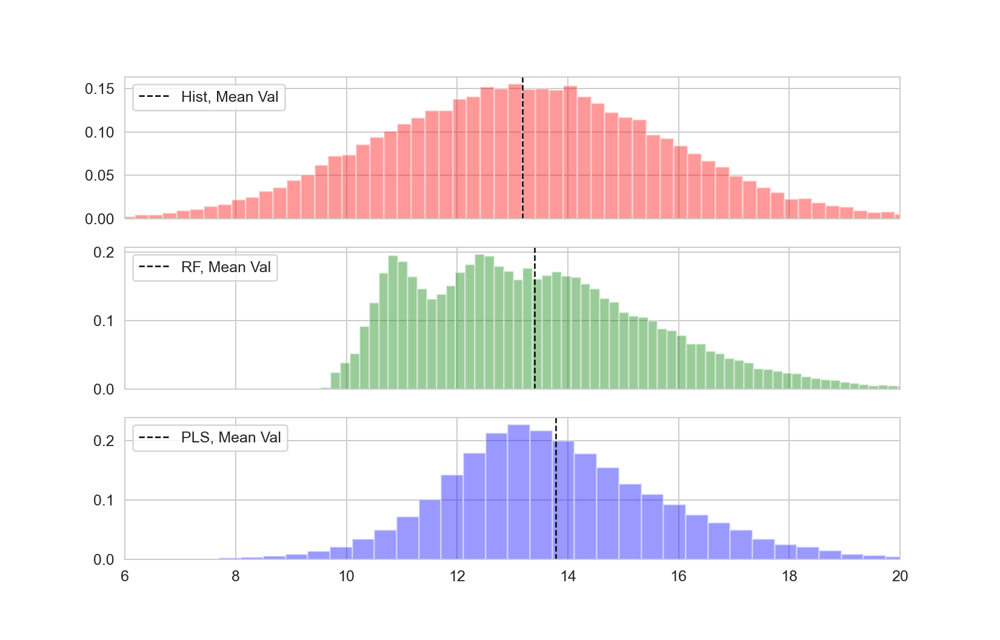

In [16]:
f, (ax1, ax2, ax3) = plt.subplots(3,1,sharex=True)
ax1.hist([mdf['vt_hist']], color=['r'], alpha=0.4, bins=100, density=True)
ax1.axvline(mdf['vt_hist'].mean(), color='k', linestyle='dashed', linewidth=1)
ax1.legend(["Hist, Mean Val"], loc='upper left')
ax2.hist([mdf['vt_RF']], color=['g'], alpha=0.4, bins=100, density=True)
ax2.axvline(mdf['vt_RF'].mean(), color='k', linestyle='dashed', linewidth=1)
ax2.legend(["RF, Mean Val"], loc='upper left')
ax3.hist([mdf['vt_PLS']], color=['b'], alpha=0.4, bins=100, density=True)
ax3.axvline(mdf['vt_PLS'].mean(), color='k', linestyle='dashed', linewidth=1)
ax3.legend(["PLS, Mean Val"], loc='upper left')
plt.xlim(6, 20)
plt.show()

<IPython.core.display.Javascript object>


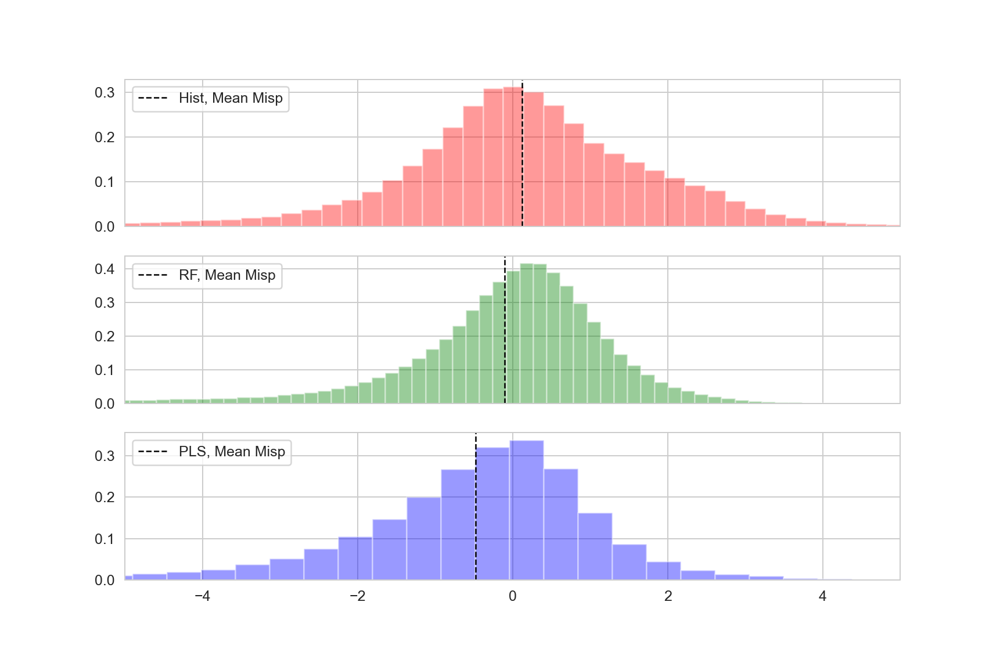

In [15]:
f, (ax1, ax2, ax3) = plt.subplots(3,1,sharex=True)
ax1.hist([mdf['misp_hist']], color=['r'], alpha=0.4, bins=100, density=True)
ax1.axvline(mdf['misp_hist'].mean(), color='k', linestyle='dashed', linewidth=1)
ax1.legend(["Hist, Mean Misp"], loc='upper left')
ax2.hist([mdf['misp_RF']], color=['g'], alpha=0.4, bins=100, density=True)
ax2.axvline(mdf['misp_RF'].mean(), color='k', linestyle='dashed', linewidth=1)
ax2.legend(["RF, Mean Misp"], loc='upper left')
ax3.hist([mdf['misp_PLS']], color=['b'], alpha=0.4, bins=100, density=True)
ax3.axvline(mdf['misp_PLS'].mean(), color='k', linestyle='dashed', linewidth=1)
ax3.legend(["PLS, Mean Misp"], loc='upper left')

plt.xlim(-5, 5)
plt.show()

<IPython.core.display.Javascript object>


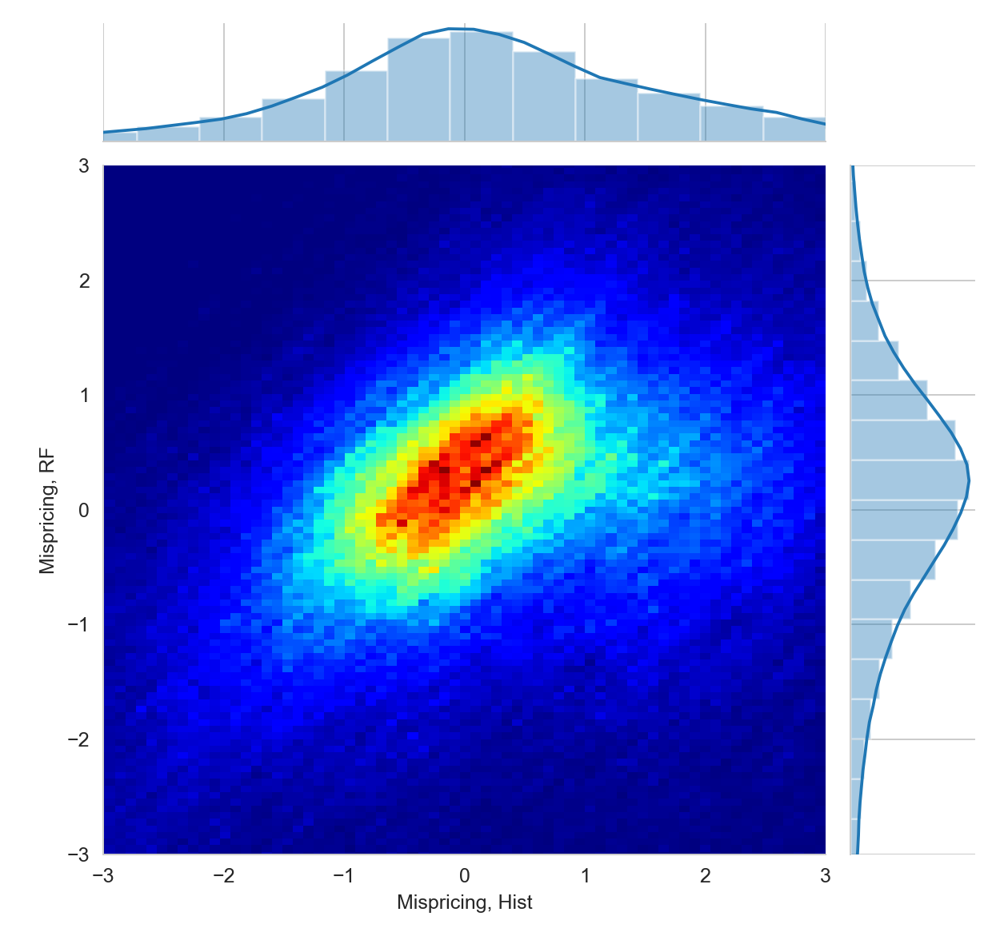

In [19]:
import matplotlib.cm as cm
# Calculate the point density
x=mdf['misp_hist']
y=mdf['misp_RF']
ax1 = sns.jointplot(x, y, kind='reg')
ax1.ax_joint.cla()
plt.sca(ax1.ax_joint)
plt.hist2d(x, y, bins=(300, 300), cmap=cm.jet)
plt.ylim(-3, 3)
plt.xlim(-3, 3)
plt.xlabel('Mispricing, Hist')
plt.ylabel('Mispricing, RF') 
plt.show()

In [20]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.offline as pyo
pyo.init_notebook_mode()
# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=monthly_mean.index, y=monthly_mean['vt_hist'], name="Mean log valuation, HIST",
              line=dict(color="darkblue")),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=monthly_mean.index, y=monthly_mean['vt_PLS'], name="Mean log valuation, PLS",
            line=dict(color="cyan")),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=monthly_mean.index, y=monthly_mean['vt_RF'], name="Mean log valuation, RF",
              line=dict(color="blue")),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=monthly_mean.index, y=monthly_mean['me'], name="Mean log market cap",
               line=dict(color="fuchsia")),
    secondary_y=False,
)

# Add figure title
fig.update_layout(
    title_text="Mean log valuation and market cap"
)

# Set x-axis title
fig.update_xaxes(title_text="Date")

# Set y-axes titles
fig.update_yaxes(title_text="Mean log valuation", secondary_y=False)
fig.update_yaxes(title_text="Mean log market cap", secondary_y=True)

fig.update_layout(
    legend=dict(
        x=0,
        y=1,
        traceorder="normal",
        font=dict(
            family="sans-serif",
            size=10,
            color="black"
        ),
    )
)

fig.show()

In [21]:
# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=monthly_mean_nyse.index, y=monthly_mean_nyse['vt_hist'], name="Mean log valuation, HIST",
              line=dict(color="darkblue")),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=monthly_mean_nyse.index, y=monthly_mean_nyse['vt_PLS'], name="Mean log valuation, PLS",
            line=dict(color="cyan")),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=monthly_mean_nyse.index, y=monthly_mean_nyse['vt_RF'], name="Mean log valuation, RF",
              line=dict(color="blue")),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=monthly_mean_nyse.index, y=monthly_mean_nyse['me'], name="Mean log market cap",
               line=dict(color="fuchsia")),
    secondary_y=False,
)

# Add figure title
fig.update_layout(
    title_text="Mean log valuation and market cap, NYSE"
)

# Set x-axis title
fig.update_xaxes(title_text="Date")

# Set y-axes titles
fig.update_yaxes(title_text="Mean log valuation", secondary_y=False)
fig.update_yaxes(title_text="Mean log market cap", secondary_y=True)

fig.update_layout(
    legend=dict(
        x=0,
        y=1,
        traceorder="normal",
        font=dict(
            family="sans-serif",
            size=10,
            color="black"
        ),
    )
)

fig.show()

In [22]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.offline as pyo
pyo.init_notebook_mode()
# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=monthly_mean.index, y=monthly_mean['misp_hist'], name="Mean mispricing, HIST",
              line=dict(color="darkblue")),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=monthly_mean.index, y=monthly_mean['misp_PLS'], name="Mean mispricing, PLS",
            line=dict(color="cyan")),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=monthly_mean.index, y=monthly_mean['misp_RF'], name="Mean mispricing, RF",
              line=dict(color="blue")),
    secondary_y=False,
)

# Add figure title
fig.update_layout(
    title_text="Mean misp"
)

# Set x-axis title
fig.update_xaxes(title_text="Date")

# Set y-axes titles
fig.update_yaxes(title_text="Mean mispricing", secondary_y=False)

fig.update_layout(
    legend=dict(
        x=0,
        y=1,
        traceorder="normal",
        font=dict(
            family="sans-serif",
            size=10,
            color="black"
        ),
    )
)

fig.show()

In [23]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.offline as pyo
pyo.init_notebook_mode()
# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=monthly_mean_nyse.index, y=monthly_mean_nyse['misp_hist'], name="Mean mispricing, HIST",
              line=dict(color="darkblue")),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=monthly_mean_nyse.index, y=monthly_mean_nyse['misp_PLS'], name="Mean mispricing, PLS",
            line=dict(color="cyan")),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=monthly_mean_nyse.index, y=monthly_mean_nyse['misp_RF'], name="Mean mispricing, RF",
              line=dict(color="blue")),
    secondary_y=False,
)

# Add figure title
fig.update_layout(
    title_text="Mean misp"
)

# Set x-axis title
fig.update_xaxes(title_text="Date")

# Set y-axes titles
fig.update_yaxes(title_text="Mean mispricing, NYSE", secondary_y=False)

fig.update_layout(
    legend=dict(
        x=0,
        y=1,
        traceorder="normal",
        font=dict(
            family="sans-serif",
            size=10,
            color="black"
        ),
    )
)

fig.show()